In [ ]:
import warnings
warnings.filterwarnings("ignore")

In [ ]:
if 'google.colab' in str(get_ipython()):
    # Colab specific setup
    assignment_path = '/content/gdrive/My Drive/CIS680_2021/HW3/'
    
    # Mount your drive
    from google.colab import drive
    drive.mount("/content/gdrive")
    
    # Setup assignment folder and switch
    import os
    os.makedirs(assignment_path, exist_ok=True)
    os.chdir(assignment_path)

Mounted at /content/gdrive


Change the path of the dataset for implementation in your local system.

In [ ]:
import h5py
import numpy as np
import torch
from torch.utils.data import DataLoader
from torchvision import transforms
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle


path_images = '/content/gdrive/MyDrive/CIS680_2021/HW3/hw3_mycocodata_img_comp_zlib.h5' # change the path of the dataset
path_labels = '/content/gdrive/MyDrive/CIS680_2021/HW3/hw3_mycocodata_labels_comp_zlib.npy'
path_masks = '/content/gdrive/MyDrive/CIS680_2021/HW3/hw3_mycocodata_mask_comp_zlib.h5'
path_bboxes = '/content/gdrive/MyDrive/CIS680_2021/HW3/hw3_mycocodata_bboxes_comp_zlib.npy'

path = (path_images, path_labels, path_masks, path_bboxes)

In [ ]:
def display(image,labels,masks,bboxes):
    cm = {1:'RdBu',2:'PiYG',3:'coolwarm'}
    figure, ax = plt.subplots(1)
    img = image.numpy()
#     img = img/np.amax(img) 
    ax.imshow(img.transpose(1,2,0))
    for c,b,mask in zip(labels,bboxes,masks):
        print('display_mask',mask.shape)
        x1,y1,x2,y2 = b
        w = abs(x1-x2)
        h = abs(y1-y2)
        x = x2-w
        y = y2-h
        rect = Rectangle((x,y),w,h, edgecolor = 'red', facecolor='none')
        ax.add_patch(rect)
        masked = np.ma.masked_where(mask==0, mask)
        ax.imshow(masked, cmap=cm[c.item()],alpha=0.7)
        

def collate_fn(batch):
    transed_img_list = []
    label_list = []
    transed_mask_list = []
    transed_bbox_list = []
    for transed_img, label, transed_mask, transed_bbox in batch:
        transed_img_list.append(transed_img)
        label_list.append(label)
        transed_mask_list.append(transed_mask)
        transed_bbox_list.append(transed_bbox)

    return torch.stack(transed_img_list, dim=0),\
        label_list,\
        transed_mask_list,\
        transed_bbox_list


class BuildDataset(torch.utils.data.Dataset):
    
    def __init__(self,path):
        
        path_images, path_labels, path_masks, path_bboxes = path
        
        self.images = h5py.File(path_images)['data']
        self.masks = h5py.File(path_masks)['data']
        self.bboxes = np.load(path_bboxes, allow_pickle=True)
        self.labels = np.load(path_labels, allow_pickle=True)
        self.image_transform = transforms.Compose([
            transforms.Resize((800,1066)),
            transforms.Normalize((0.485,0.456,0.406),(0.229,0.224,0.225)),
            transforms.Pad((11,0))
        ])
        self.mask_transform = transforms.Compose([
            transforms.Resize((800,1066)),
            transforms.Pad((11,0))
        ])
        
    def __len__(self):
        return len(self.images)
    
    def __getitem__(self, idx):
        
        image = self.image_transform(torch.tensor(self.images[idx]/255,dtype=torch.float))
        label = torch.tensor(self.labels[idx],dtype=torch.float)
        nobjects = len(label)
        o = sum([len(self.labels[i]) for i in range(idx)])
        mask = self.mask_transform(torch.tensor(self.masks[o:(o+nobjects),:,:]/1.0, dtype=torch.float))
        bbox = torch.tensor(self.bboxes[idx],dtype=torch.float)
        temp = torch.ones_like(bbox)
        temp[:,0],temp[:,1],temp[:,2],temp[:,3] = 8/3,2.665,8/3,2.665
        bbox = (bbox*temp).int()
        temp = torch.zeros_like(bbox)
        temp[:,1],temp[:,3] = 11,11
        bbox = bbox + temp
        return image, label, mask, bbox

In [ ]:
dataset = BuildDataset(path)
 
# Creatiing smaller dataset for shorter runtime 
size =len(dataset)
small_dataset = int(len(dataset) * 0.007) 
temp_split = size - small_dataset
torch.random.manual_seed(1)    

# batch size =5 ( crashes for bigger batch sizes)
train_dataset, test_dataset = torch.utils.data.random_split(dataset, [small_dataset, temp_split]) 

dataloader = DataLoader(train_dataset, batch_size=5,shuffle=False, collate_fn=collate_fn)


In [ ]:
# dataloader2 = DataLoader(train_dataset, batch_size=10,shuffle=False, collate_fn=collate_fn) 
# images, labels, masks, bboxes = next(iter(dataloader2))
# print(images.shape)
# for i in range(10):
#     display(images[i],labels[i],masks[i],bboxes[i])

In [ ]:
# del (images)
# del (labels)
# del (masks)
# del (bboxes)

In [ ]:

!pip install pytorch-lightning


     |████████████████████████████████| 925 kB 13.5 MB/s 
     |████████████████████████████████| 282 kB 50.1 MB/s 
     |████████████████████████████████| 125 kB 34.9 MB/s 
     |████████████████████████████████| 829 kB 53.5 MB/s 
     |████████████████████████████████| 596 kB 46.2 MB/s 
     |████████████████████████████████| 1.3 MB 28.0 MB/s 
     |████████████████████████████████| 271 kB 53.6 MB/s 
     |████████████████████████████████| 160 kB 52.9 MB/s 
  Created wheel for future: filename=future-0.18.2-py3-none-any.whl size=491070 sha256=a8222fd703bbebc4095215eec7e12dbeaeccab557d4e64b6c3327681a3796a01
  Stored in directory: /root/.cache/pip/wheels/56/b0/fe/4410d17b32f1f0c3cf54cdfb2bc04d7b4b8f4ae377e2229ba0
Successfully built future
  Attempting uninstall: PyYAML
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
  Attempting uninstall: future
    Found existing installation: future 0.16.0
    Uninstalling future-

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [ ]:
import pytorch_lightning as pl
import torch.nn.functional as F
from scipy import ndimage



class SOLO():
  
    # _default_cfg = {
    #     'num_classes': 4,
    #     'in_channels': 256,
    #     'seg_feat_channels': 256,
    #     'stacked_convs': 7,
    #     'strides': [8, 8, 16, 32, 32],
    #     'scale_ranges': [(1, 96), (48, 192), (96, 384), (192, 768), (384, 2048)],
    #     'epsilon': 0.2,
    #     'num_grids': [40, 36, 24, 16, 12],
    #     'mask_loss_cfg': dict(weight=3),
    #     'cate_loss_cfg': dict(gamma=2, alpha=0.25, weight=1),
    #     'postprocess_cfg': dict(cate_thresh=0.2, mask_thresh=0.5, pre_NMS_num=50, keep_instance=5, IoU_thresh=0.5)
    # }
    def __init__(self,
                 num_classes,
                 in_channels=256,
                 seg_feat_channels=256,
                 stacked_convs=7,
                 strides=[8, 8, 16, 32, 32],
                 scale_ranges=((1, 96), (48, 192), (96, 384), (192, 768), (384, 2048)),
                 epsilon=0.2,
                 num_grids=[40, 36, 24, 16, 12],
                 cate_down_pos=0,
                 with_deform=False,
                 mask_loss_cfg=dict(weight=3),
                 cate_loss_cfg=dict(gamma=2,
                                alpha=0.25,
                                weight=1),
                 postprocess_cfg=dict(cate_thresh=0.2,
                                      ins_thresh=0.5,
                                      pre_NMS_num=50,
                                      keep_instance=5,
                                      IoU_thresh=0.5)):
        super(SOLO, self).__init__()
        self.num_classes = num_classes
        self.seg_num_grids = num_grids
        self.cate_out_channels = self.num_classes - 1
        self.in_channels = in_channels
        self.seg_feat_channels = seg_feat_channels
        self.stacked_convs = stacked_convs
        self.strides = strides
        self.epsilon = epsilon
        self.cate_down_pos = cate_down_pos
        self.scale_ranges = scale_ranges
        self.with_deform = with_deform
        self.device =device
        self.mask_loss_cfg = mask_loss_cfg
        self.cate_loss_cfg = cate_loss_cfg
        self.postprocess_cfg = postprocess_cfg 
    # def __init__(self, **kwargs):
    #     super().__init__()
    #     for k, v in {**self._default_cfg, **kwargs}.items():
    #         setattr(self, k, v)
        
    #     pretrained_model = torchvision.models.detection.maskrcnn_resnet50_fpn(pretrained=False, pretrained_backbone=True)
    #     self.backbone = pretrained_model.backbone
    #     self.seg_num_grids = num_grids
    #     self.strides = strides
        
        
    # Forward function should calculate across each level of the feature pyramid network.
    # Input:
    #     images: batch_size number of images
    # Output:
    #     if eval = False
    #         category_predictions: list, len(fpn_levels), each (batch_size, C-1, S, S)
    #         mask_predictions:     list, len(fpn_levels), each (batch_size, S^2, 2*feature_h, 2*feature_w)
    #     if eval==True
    #         category_predictions: list, len(fpn_levels), each (batch_size, S, S, C-1)
    #         / after point_NMS
    #         mask_predictions:     list, len(fpn_levels), each (batch_size, S^2, image_h/4, image_w/4)
    #         / after upsampling
    def forward(self, images, eval=True):
        # you can modify this if you want to train the backbone
        feature_pyramid = [v.detach() for v in self.backbone(images).values()] # this has strides [4,8,16,32,64]

        ...
        
    # This function build the ground truth tensor for each batch in the training
    # Input:
    #     bounding_boxes:   list, len(batch_size), each (n_object, 4) (x1 y1 x2 y2 system)
    #     labels:           list, len(batch_size), each (n_object, )
    #     masks:            list, len(batch_size), each (n_object, 800, 1088)
    # Output:
    #     category_targets: list, len(batch_size), list, len(fpn), (S, S), values are {1, 2, 3}
    #     mask_targets:     list, len(batch_size), list, len(fpn), (S^2, 2H_f, 2W_f)
    #     active_masks:     list, len(batch_size), list, len(fpn), (S^2,)
    #     / boolean array with positive mask predictions
    
    def MultiApply(self, func, *args,**kwargs):
        from functools import partial 
        pfunc = partial(func, **kwargs) if kwargs else func
        map_results = map(pfunc, *args)

        return tuple(map(list, zip(*map_results)))

    # This function builds the ground truth tensor for each batch in the training
    # Uses MultiApply to compute ins_gts_list, ins_ind_gts_list, cate_gts_list. Parallel w.r.t. img mini-batch
    # We construct a target of the same resolution as prediction output in training
    def target(self,
               ins_pred_list,
               bbox_list,
               label_list,
               mask_list):
        ins_label_list, ins_ind_label_list, cate_label_list = self.MultiApply(self.generate_targets, bbox_list, label_list, mask_list)

        return ins_label_list, ins_ind_label_list, cate_label_list
    
    
    
    def generate_targets(self, bounding_boxes, labels, masks):
          
            
        category_label_list =[]
        mask_targets_list = []
        active_mask_list = []
        
        bbox= torch.reshape(bounding_boxes,(-1,4)) # ??
        

        
        orginal_height = masks[0,:,:].shape[-2]
        orginal_width =  masks[0,:,:].shape[-1]
        
        
        # area = torch.sqrt((bounding_boxes[:,2] - bounding_boxes[:,0])*(bounding_boxes[:,3] - bounding_boxes[:,1]))
        area = torch.sqrt((bbox[:,2] - bbox[:,0])*(bbox[:,3] - bbox[:,1]))

        # for i,size  in enumerate(fpn_size):
        #   if(i==0):
        #       idx1 = area<96
        #   elif i ==1:
        #       idx2 = torch.logical_and(area<192,area>48)
        #   elif i==2:
              
        #       idx3 = torch.logical_and(area<384 ,area>96)
      
        #   elif i==3:
        #       idx4 = torch.logical_and(area<768,area>192)
        #   elif i ==4:
        #       id54 = area>=384
                
        
        # fpn_level = [torch.nonzero(idx1,as_tuple=False).view(-1),
        #               torch.nonzero(idx2,as_tuple=False).view(-1),
        #               torch.nonzero(idx3,as_tuple=False).view(-1),
        #               torch.nonzero(idx4,as_tuple=False).view(-1),
        #               torch.nonzero(idx5,as_tuple=False).view(-1)
        #               ]

        fpn_level = [torch.nonzero(area<96,as_tuple=False).view(-1),
                      torch.nonzero((1*area>48)*(1*area<192),as_tuple=False).view(-1),
                      torch.nonzero((1*area>96)*(1*area<384),as_tuple=False).view(-1),
                      torch.nonzero((1*area>192)*(1*area<768),as_tuple=False).view(-1),
                      torch.nonzero(area>=384,as_tuple=False).view(-1)
                      ]
        
        

        
        # re scaling the mask 
        
        for level_idx,level in enumerate(fpn_level):
            
          scaled_height = int(2*orginal_height/self.strides[level_idx]) 
          scaled_width = int(2*orginal_width/self.strides[level_idx]) 

          # n = self.seg_num_grids[level_idx]
          category_targets = torch.zeros(self.seg_num_grids[level_idx],self.seg_num_grids[level_idx]) # s,s
          mask_targets = torch.zeros(self.seg_num_grids[level_idx]**2,scaled_height,scaled_width) #s^2,2h,2w
          active_mask = torch.zeros(self.seg_num_grids[level_idx]**2) #s^2
          # print(mask_targets.shape)
      
          if (len(level)==0):
              
              
            category_label_list.append(category_targets)
            mask_targets_list.append(mask_targets)
            active_mask_list.append(active_mask)
            continue
              
          # i = scaled_height/n
          # j = scaled_width/n
          gi = scaled_height/self.seg_num_grids[level_idx]
          gj = scaled_width/self.seg_num_grids[level_idx]

          mask_level  = masks[level,:,:].unsqueeze(0)
          
          mask_level = F.interpolate(mask_level,size = (scaled_height,scaled_width),mode = 'nearest').squeeze(0) #squeeze(0)?
          
          for i in range(mask_level.shape[0]):
              
            cy,cx = ndimage.measurements.center_of_mass(mask_level[i].detach().numpy().astype(int))

            cy,cx = torch.tensor(cy),torch.tensor(cx)

            # tempx =(cx/i).type(torch.long)
            # tempy = (cy/j).type(torch.long)
            tempx =(cx/gj).type(torch.long)
            tempy = (cy/gi).type(torch.long)


            active_mask[self.seg_num_grids[level_idx]*tempy+tempx] = labels[level[i]]

            bb_w = 2*0.2*(bbox[level[i],2]-bbox[level[i],0])/self.strides[level_idx]

            bb_h = 2*0.2*(bbox[level[i],3]-bbox[level[i],1])/self.strides[level_idx]

            g_x1 = ((cx- bb_w/2)/gj).type(torch.long).item()
            g_y1 = ((cy - bb_h/2)/gi).type(torch.long).item()
            g_x2 = ((cx + bb_w/2)/gj).type(torch.long).item()
            g_y2 = ((cy + bb_h/2)/gi).type(torch.long).item()
            mesh_x, mesh_y = torch.meshgrid([torch.arange(g_x1, g_x2 + 1), torch.arange(g_y1, g_y2 + 1)])
      
            category_targets[mesh_y, mesh_x] = labels[level[i]].item()

            mask_targets[(mesh_y.reshape(-1)*self.seg_num_grids[level_idx] + mesh_x.reshape(-1)).type(torch.long),:,:] = mask_level[i].type(torch.float32)
        
          category_label_list.append(category_targets)
          mask_targets_list.append(mask_targets)
          active_mask_list.append(active_mask)

        return  mask_targets_list, active_mask_list,category_label_list,






                



      
                

In [ ]:
 def pyramid_plots(ins_label_list,ins_ind_label_list,img):

      for i in range(len(ins_label_list)):
          idx = torch.nonzero(ins_ind_label_list[i] > 0,as_tuple=False).flatten().tolist()
          print("FPN Level", i)
          if (len(idx) == 0):
            transform_back = transforms.Normalize(mean=[-0.485/0.229, -0.456/0.224, -0.406/0.255], std=[1/0.229, 1/0.224, 1/0.225])
            img2 = transform_back(img.squeeze(0))
            img2 = np.copy(img2.numpy().transpose(1,2,0))
            plt.figure()
            plt.imshow(img2)
            plt.show()
            continue

          mask = ins_label_list[i][idx].unsqueeze(0)
          
          mask_resize = F.interpolate(mask, size=(img.shape[-2],img.shape[-1]), mode='nearest')
          # print("mask",mask)
          label = ins_ind_label_list[i][idx].view(-1)
          FPN_levels_plot(img,label,mask_resize,[])
          # display(img.squeeze(0),label,mask.squeeze(0).squeeze(0),[])
            

In [ ]:
def FPN_levels_plot(img,label,mask,bbox):
  plt.figure()
  ax = plt.gca()

  transform_back= transforms.Normalize(mean=[-0.485/0.229, -0.456/0.224, -0.406/0.255], std=[1/0.229, 1/0.224, 1/0.225])
  img2 = transform_back(img.squeeze(0))
  img2 = np.copy(img2.numpy().transpose(1,2,0))
  
  mask = mask.squeeze(0)
  n = label.shape[0] 
  for i in range(n):
    c = label[i]
    mask2 = mask[i]
    if (c == 1):
      img2[mask2 == 1,2] = 175
    if (c == 3):
      img2[mask2 == 1,0] = 175
    if (c == 2):
      img2[mask2 == 1,1] = 175
  plt.imshow(img2)
  plt.show()

In [ ]:
dataset1 = BuildDataset(path)
 
# Creatiing smaller dataset for shorter runtime 
size1 =len(dataset1)
small_dataset1 = int(len(dataset1) * 0.007) 
temp_split1 = size1 - small_dataset1
torch.random.manual_seed(1)    

# batch size =5 ( crashes for bigger batch sizes)
train_dataset1, test_dataset1 = torch.utils.data.random_split(dataset1, [small_dataset1, temp_split1]) 

dataloader1 = DataLoader(train_dataset1, batch_size=20,shuffle=False, collate_fn=collate_fn)


# RUN THE BELOW TWO CELLs for the results
Outputs 5 display images (visualizing the Dataset) and 15 target assignment images 
Run all the cells in sequential manner.
Please change the path of the dataset path before running the cells.

DISPLAY DATASET


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


display_mask torch.Size([800, 1088])
display_mask torch.Size([800, 1088])
display_mask torch.Size([800, 1088])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


display_mask torch.Size([800, 1088])
display_mask torch.Size([800, 1088])
display_mask torch.Size([800, 1088])
display_mask torch.Size([800, 1088])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


display_mask torch.Size([800, 1088])
display_mask torch.Size([800, 1088])
display_mask torch.Size([800, 1088])
display_mask torch.Size([800, 1088])
display_mask torch.Size([800, 1088])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


display_mask torch.Size([800, 1088])
display_mask torch.Size([800, 1088])
display_mask torch.Size([800, 1088])
display_mask torch.Size([800, 1088])
display_mask torch.Size([800, 1088])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


display_mask torch.Size([800, 1088])
display_mask torch.Size([800, 1088])
display_mask torch.Size([800, 1088])
display_mask torch.Size([800, 1088])
display_mask torch.Size([800, 1088])
display_mask torch.Size([800, 1088])
display_mask torch.Size([800, 1088])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


display_mask torch.Size([800, 1088])


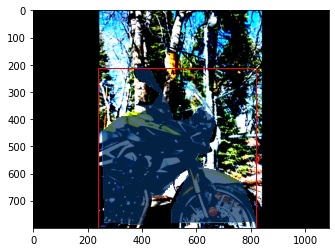

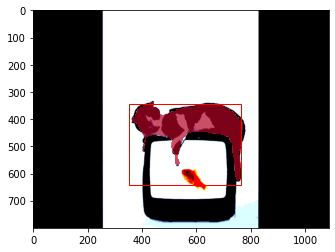

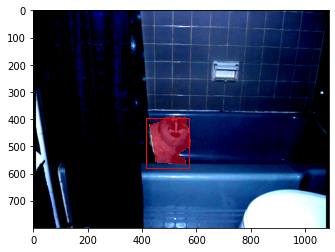

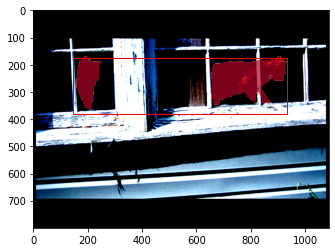

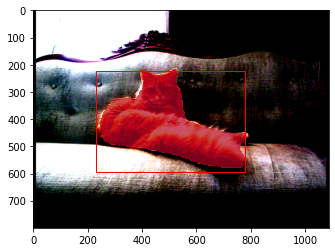

...

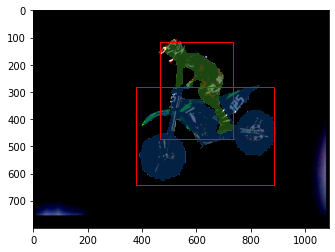

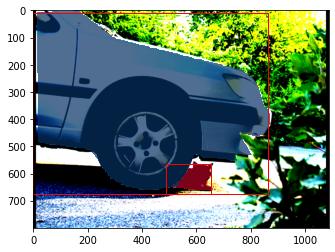

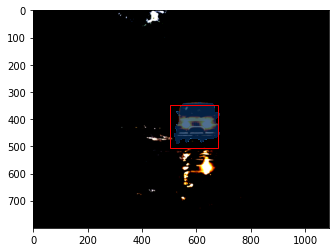

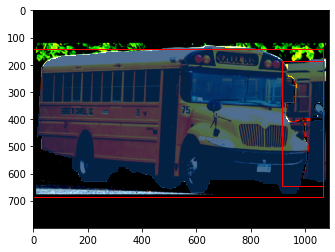

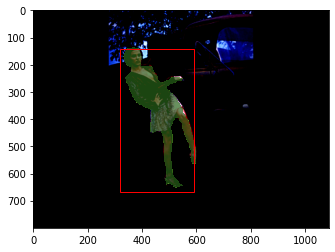

In [ ]:
#####RUN THIS CELL#####
model = SOLO(4)



print('DISPLAY DATASET')
images, labels, masks, bboxes = next(iter(dataloader1))
# print(images.shape)
for i in range(20):
    display(images[i],labels[i],masks[i],bboxes[i])

del (images)
del (labels)
del (masks)
del (bboxes)



Target Assignment 


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 0


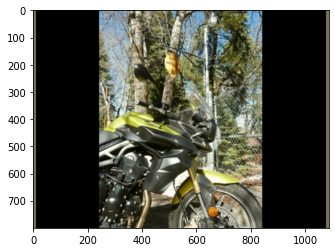

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 1


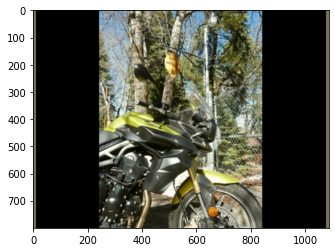

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 2


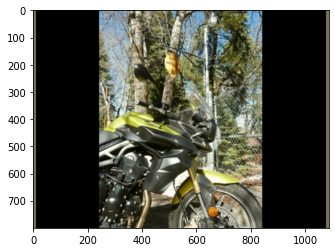

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 3


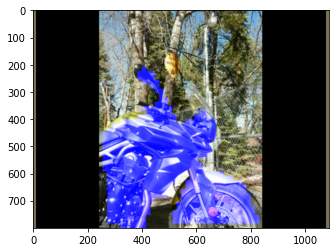

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 4


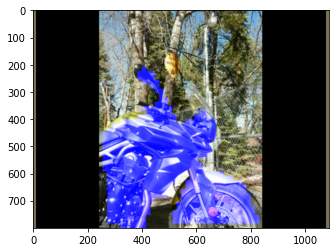

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 0


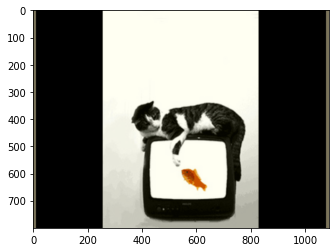

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 1


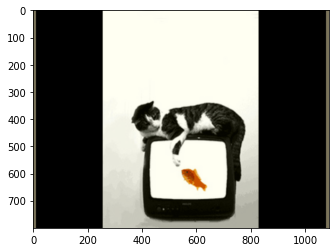

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 2


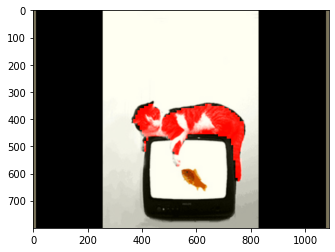

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 3


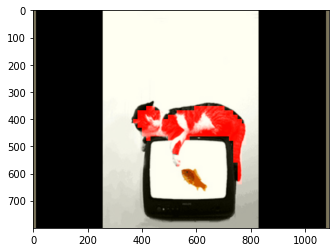

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 4


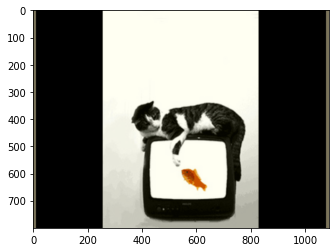

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 0


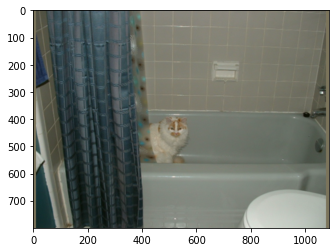

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 1


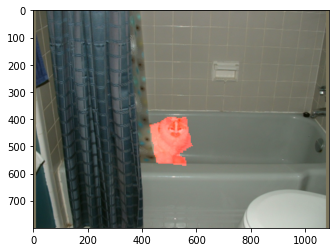

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 2


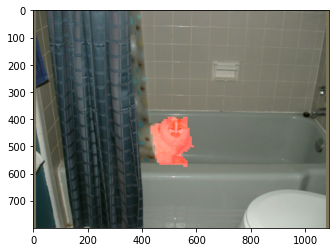

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 3


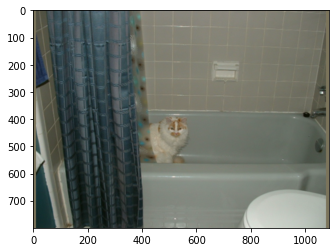

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 4


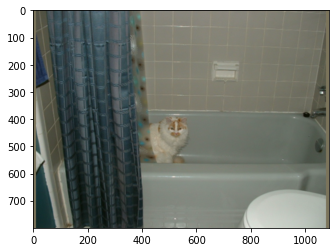

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 0


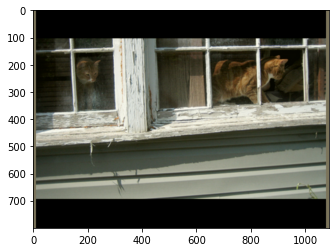

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 1


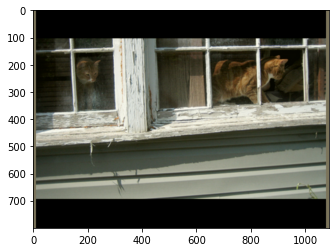

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 2


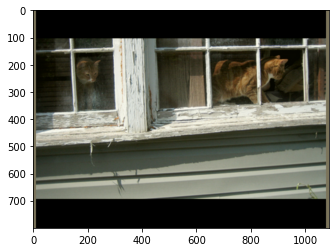

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 3


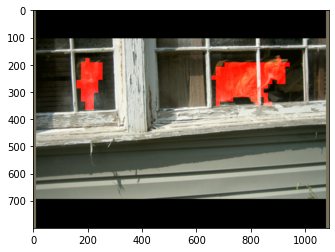

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 4


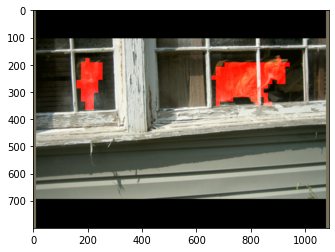

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 0


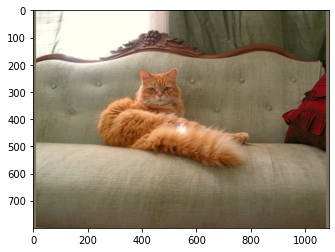

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 1


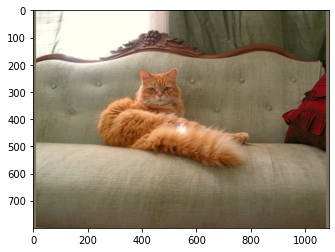

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 2


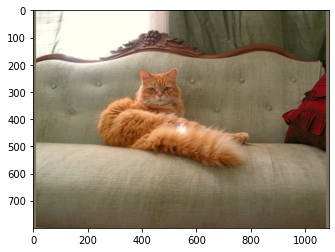

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 3


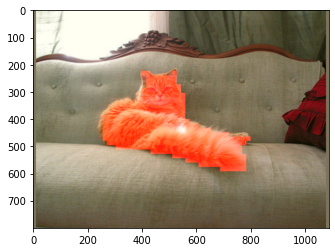

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 4


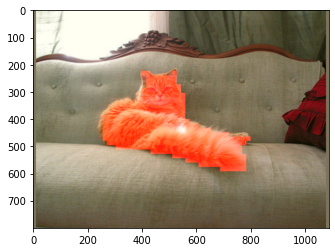

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 0


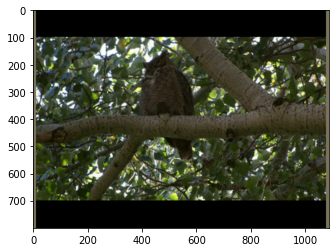

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 1


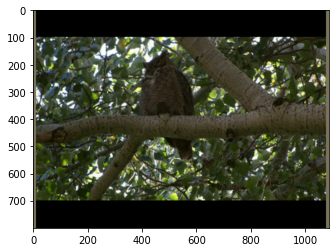

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 2


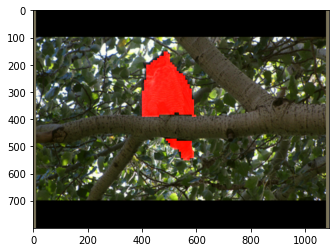

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 3


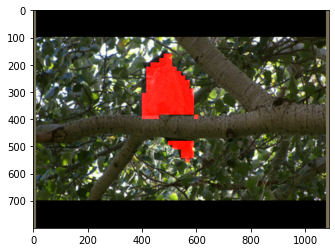

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 4


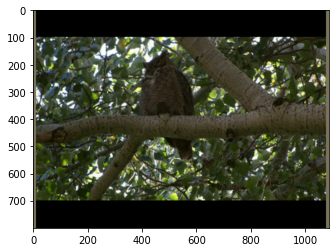

FPN Level 0


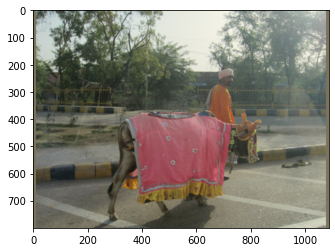

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 1


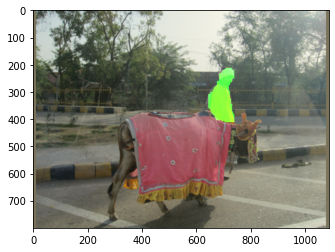

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 2


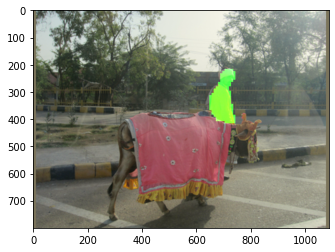

FPN Level 3


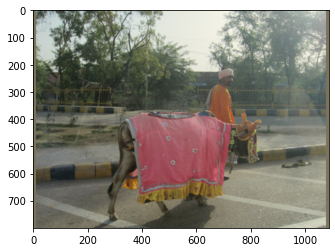

FPN Level 4


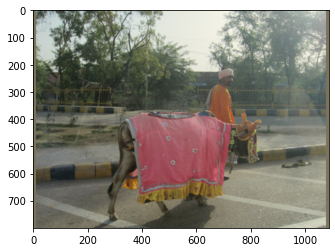

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 0


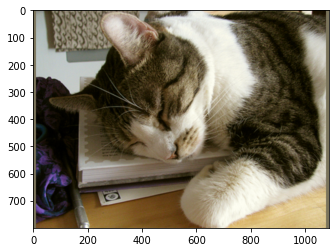

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 1


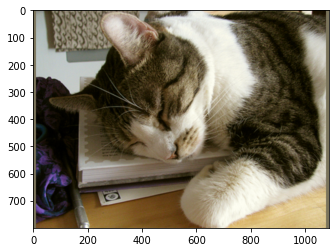

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 2


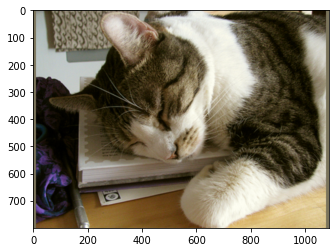

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 3


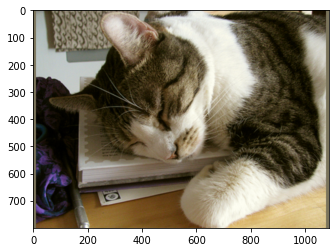

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 4


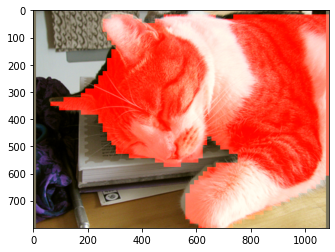

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 0


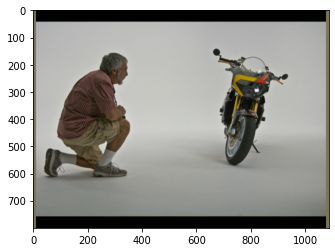

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 1


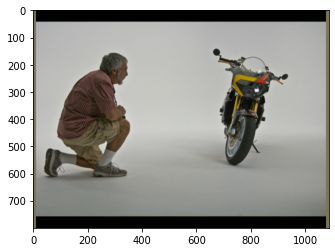

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 2


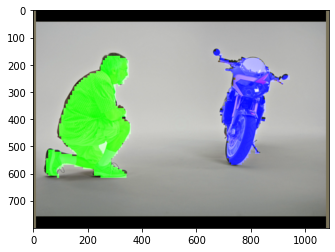

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 3


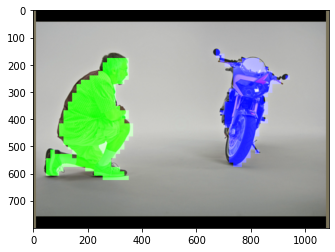

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 4


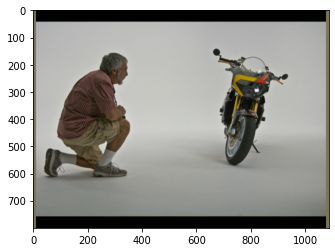

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 0


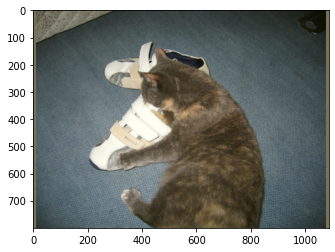

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 1


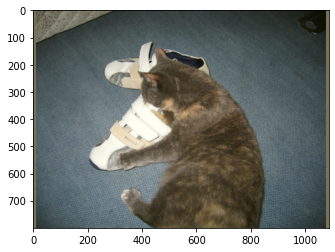

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 2


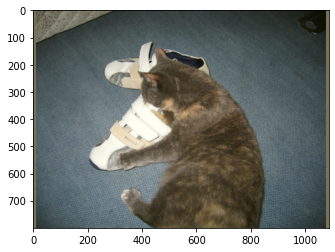

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 3


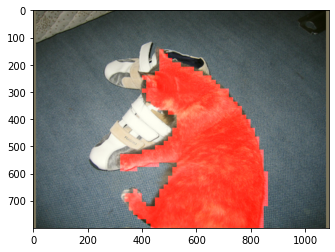

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 4


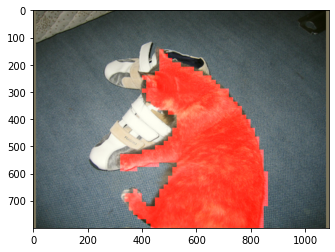

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 0


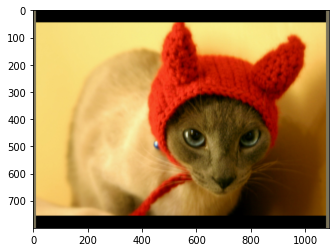

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 1


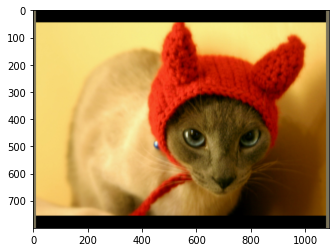

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 2


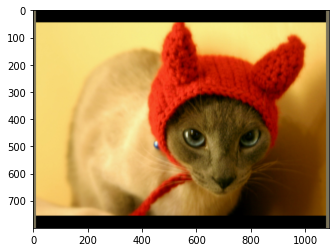

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 3


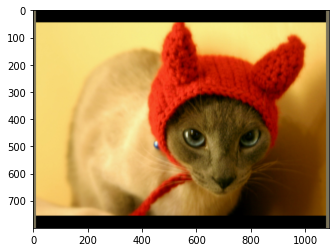

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 4


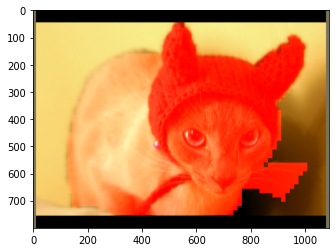

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 0


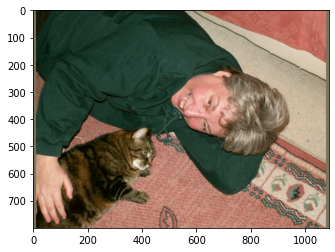

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 1


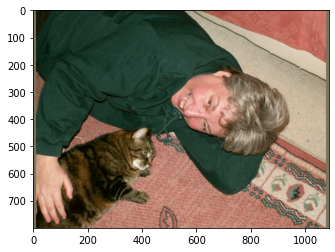

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 2


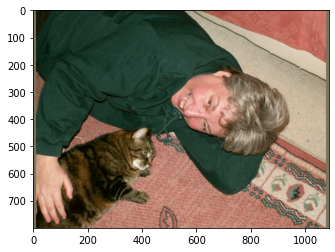

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 3


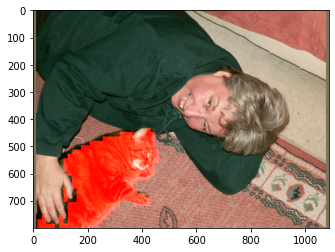

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 4


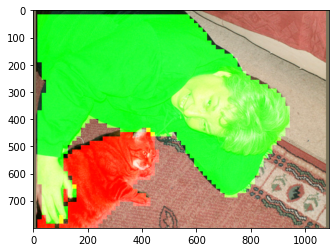

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 0


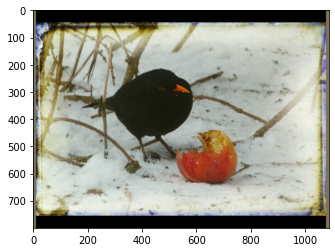

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 1


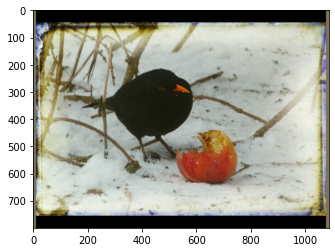

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 2


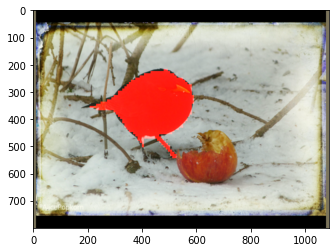

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 3


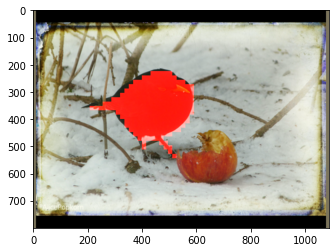

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 4


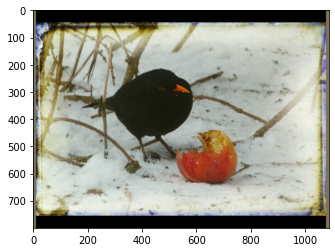

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 0


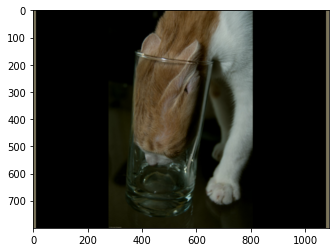

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 1


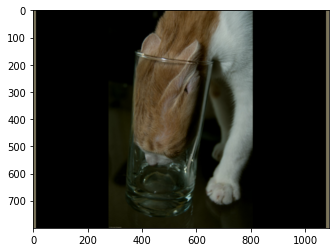

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 2


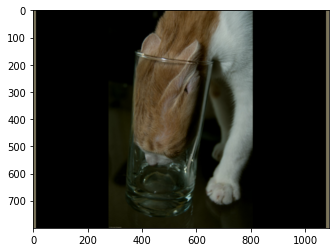

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 3


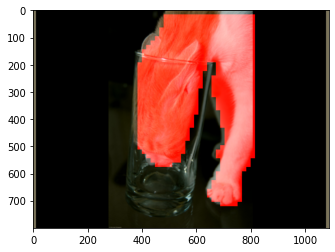

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 4


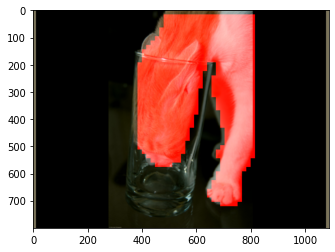

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 0


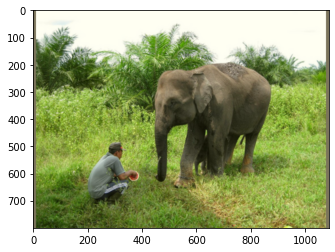

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 1


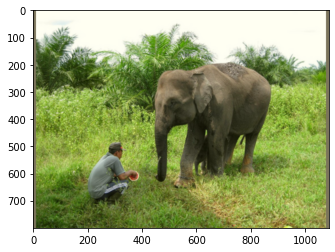

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 2


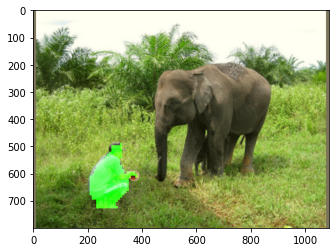

FPN Level 3


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


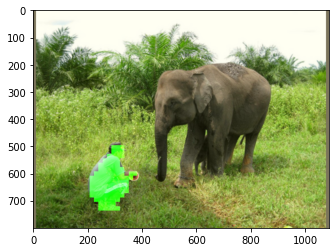

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 4


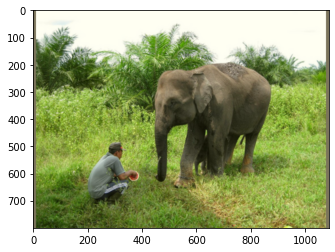

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 0


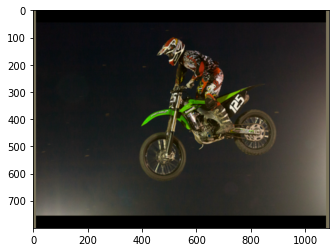

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 1


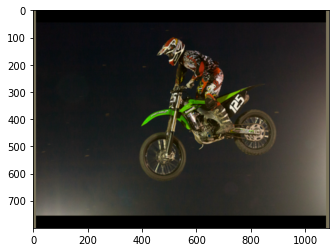

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 2


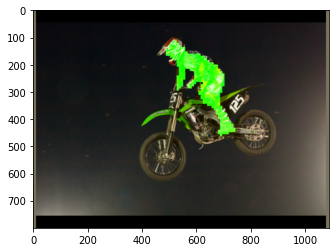

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 3


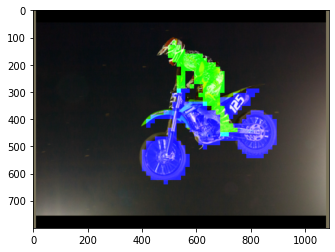

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 4


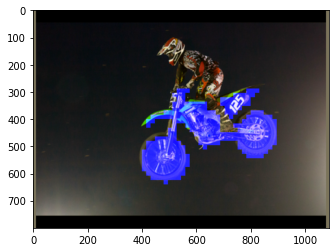

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 0


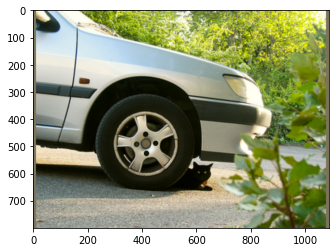

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 1


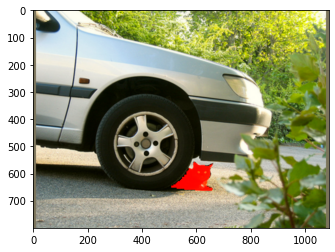

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 2


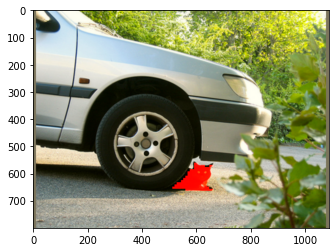

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 3


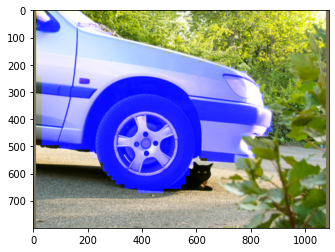

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 4


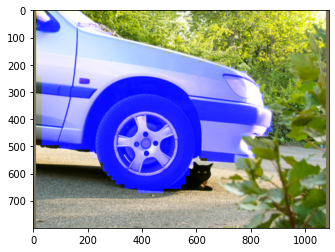

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 0


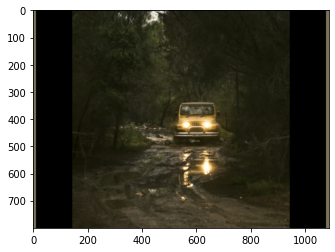

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 1


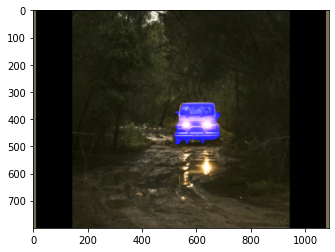

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 2


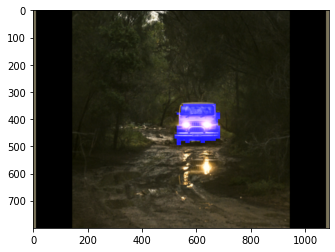

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 3


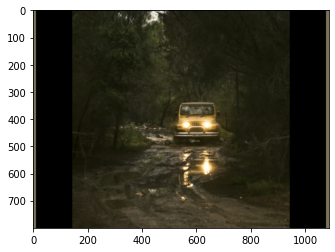

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 4


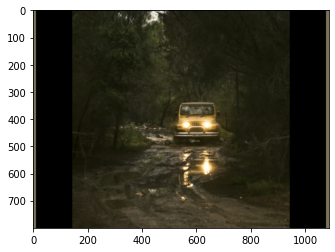

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 0


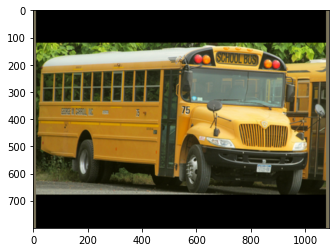

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 1


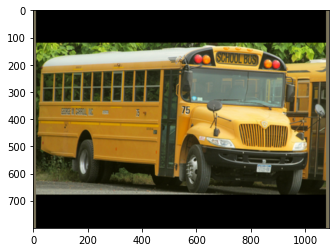

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 2


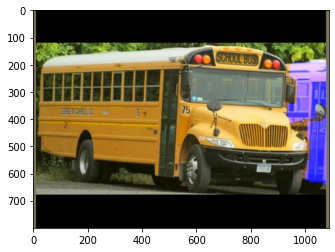

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 3


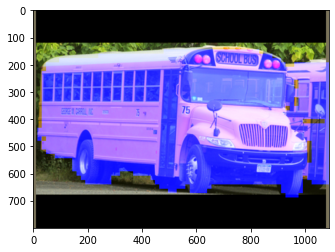

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 4


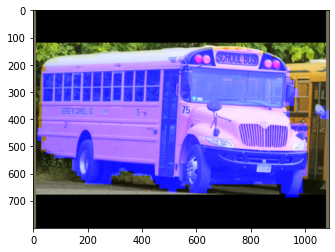

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 0


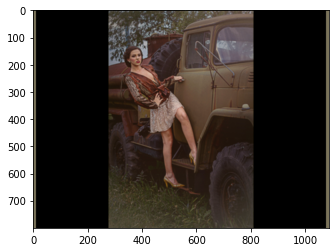

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 1


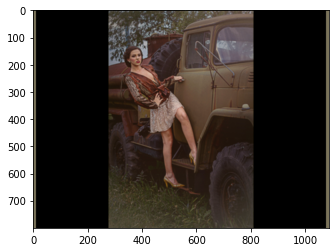

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 2


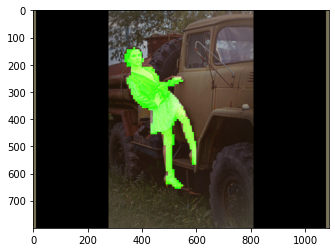

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 3


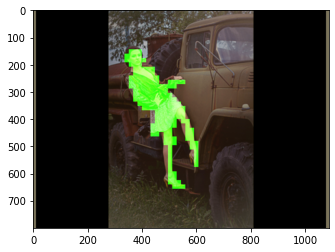

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 4


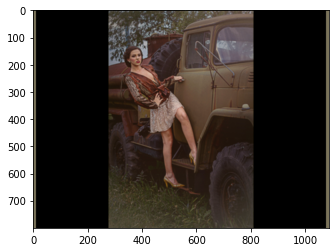

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 0


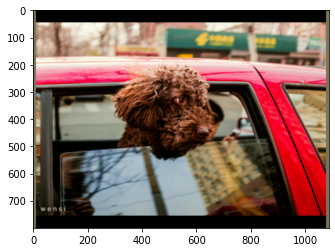

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 1


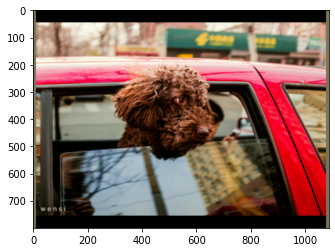

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 2


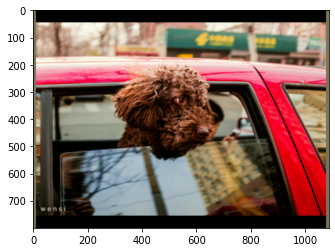

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 3


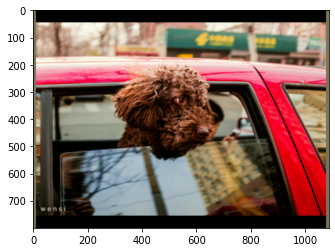

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 4


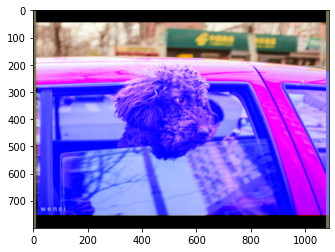

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 0


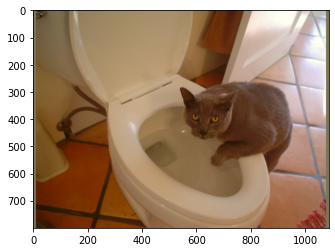

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 1


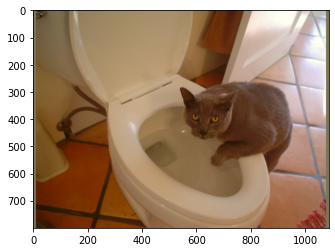

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 2


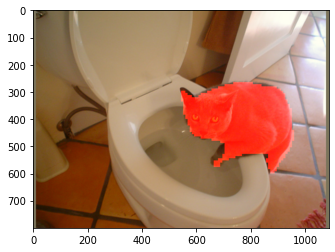

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 3


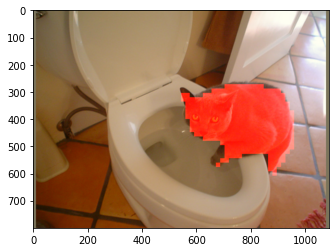

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


FPN Level 4


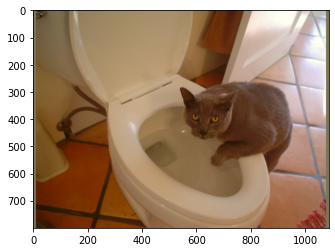

In [ ]:
print('Target Assignment ')
for iter, data in enumerate(dataloader):
  # for count in range(2):
   
  img, label, mask, bbox = [data[i] for i in range(len(data))]
  ins_label_list, ins_ind_label_list, cate_label_list = model.target(label,bbox,label,mask)
  
  for i in range(len(img)):  
    # print(img[i].shape)
    pyramid_plots(ins_label_list[i],ins_ind_label_list[i],img[i].unsqueeze(0))